In [1]:
import numpy as np
import matplotlib.pyplot as plt

import matplotlib.style
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cmx
mpl.style.use('classic')

import baraffe_tables
from baraffe_tables.table_search import baraffe_table_search

from astropy.table import Table
from astropy import units as u
from astropy.constants import G

import mesa_helper as mh
import os
import shutil

%matplotlib inline

In [2]:
mJtomSun = u.jupiterMass.to(u.solMass)
mJtoGrams = u.jupiterMass.to(u.g)

rJtorSun = u.jupiterRad.to(u.solRad)
rJtoCm = u.jupiterRad.to(u.cm)

print(mJtomSun)
print(mJtoGrams)
print(rJtorSun)
print(rJtoCm)


0.0009545942339693249
1.8981245973360504e+30
0.10276268506540176
7149200000.0


In [3]:
print(5*rJtoCm)

35746000000.0


In [8]:
#jupiter masses. note that the last 2 in this list (0.25, 0.2 Mj) weren't created successfully, so don't try to relax them
Minit = np.round(np.logspace(np.log10(0.2),np.log10(20.), num=20),2)[::-1]
#jupiter radii
Rinit = np.array((10.0,7.5,5.0,3.0,2.5,2.0,1.75,1.5,1.25,1.0))

# for now: abbreviated list to see if the relax_composition step affects the entropy
#Minit = np.array((20.0, 9.67, 4.67, 1.09))
#Rinit = np.array((5.0, 2.5, 1.0))


#overall metallicities
Zinit = np.array((0.01,0.025,0.05,0.1))

#specific entropies
Sinit = np.array((8.0,9.0,10.0,11.0))

# composition profiles
comps = ['uniform','linear','exponential','gaussian','core_uniform','core_linear','core_exponential','core_gaussian']

In [9]:
pwd

'/Users/emily/Documents/astro/giant_planets/science_runs/2_relaxed_models'

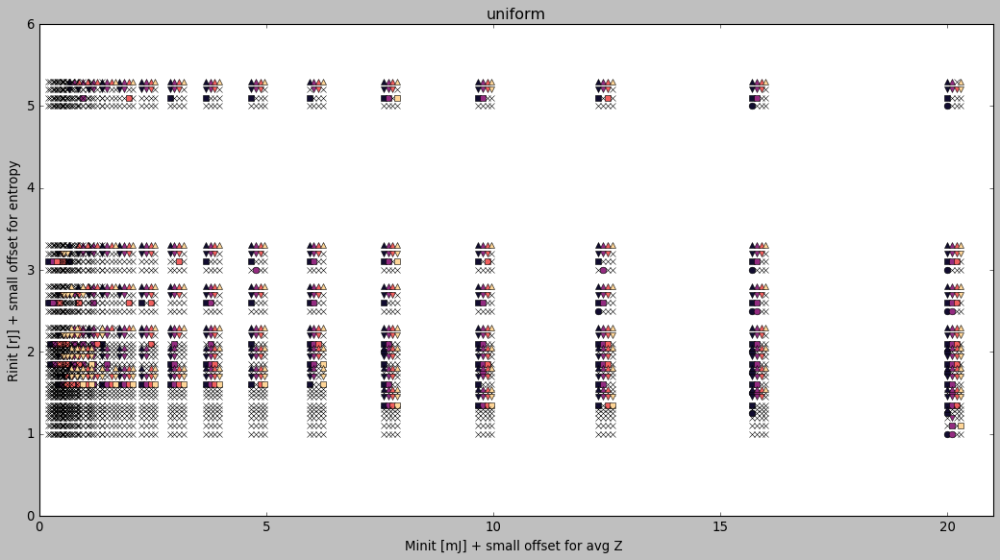

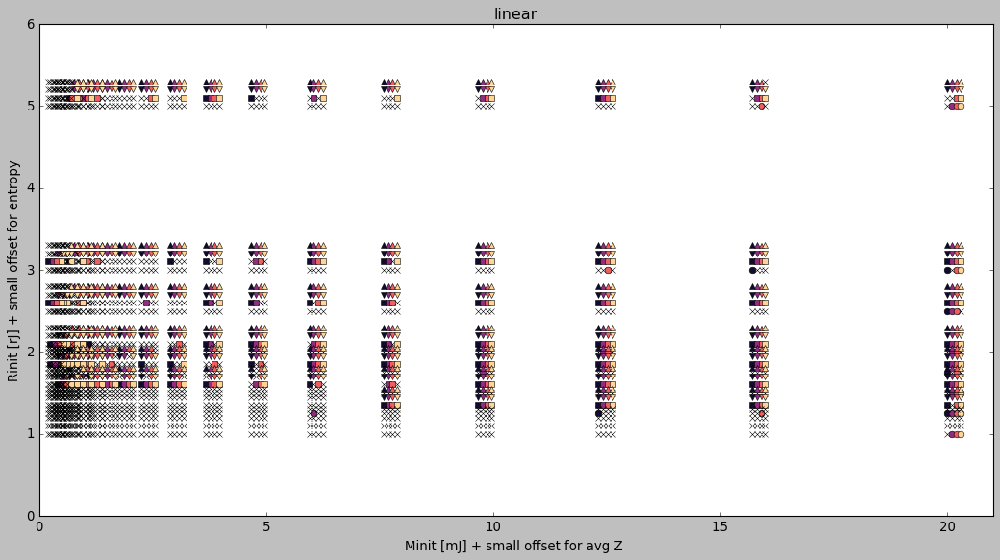

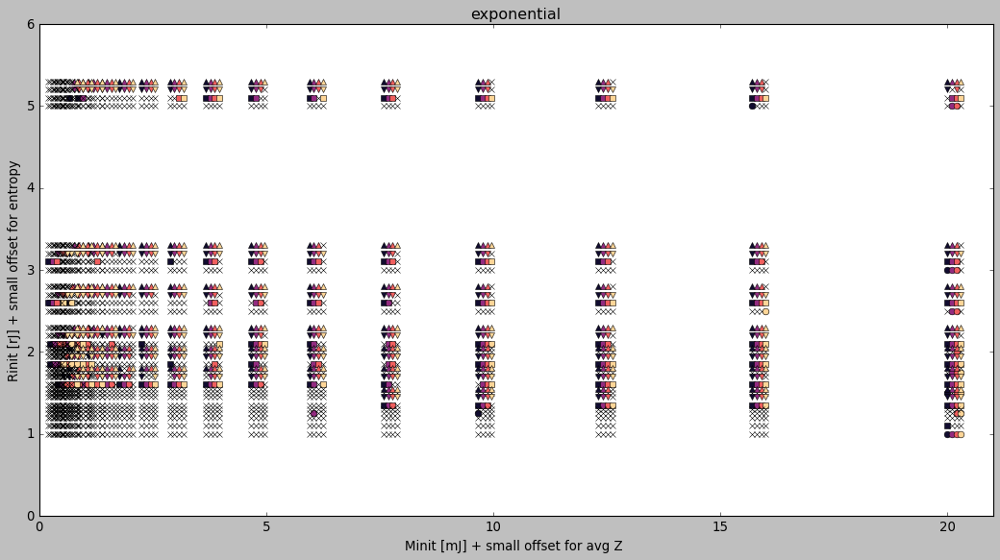

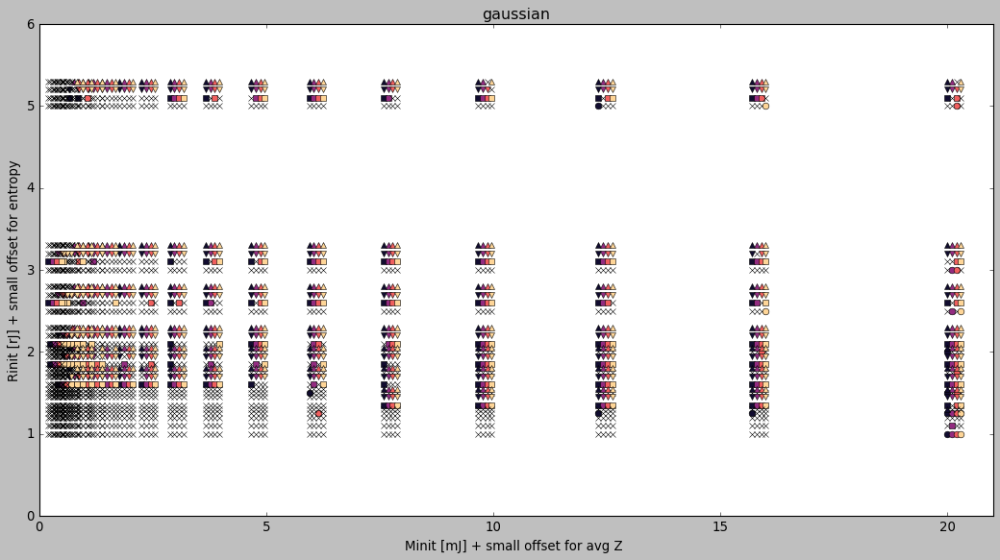

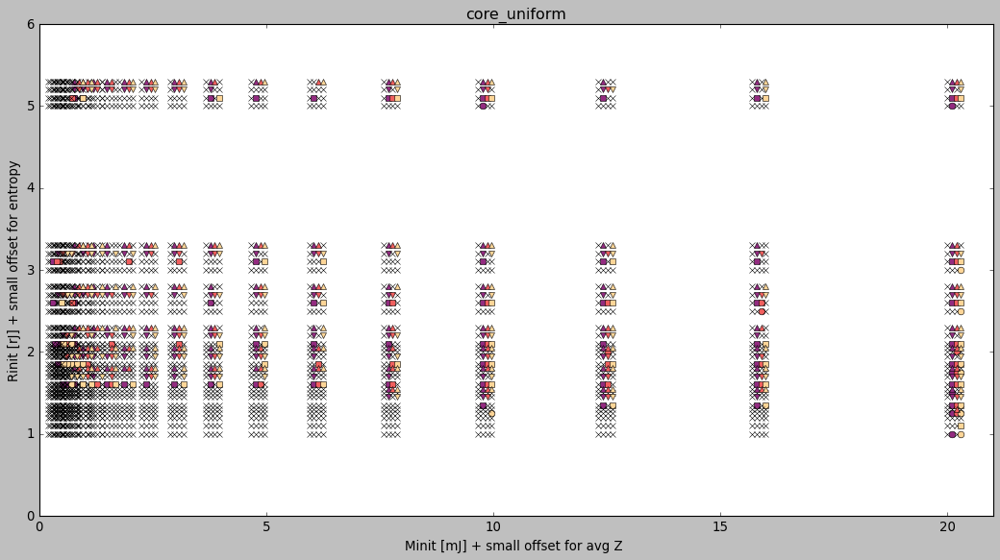

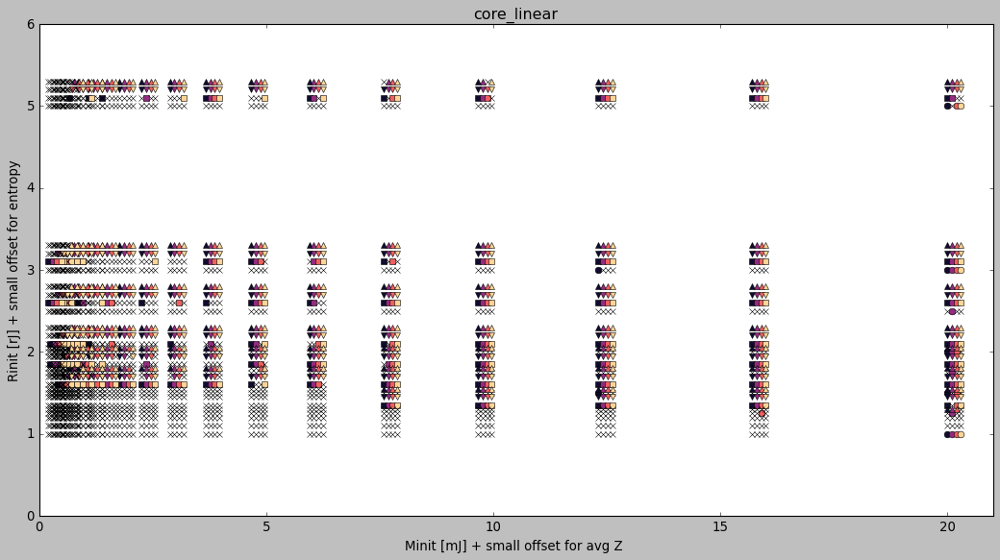

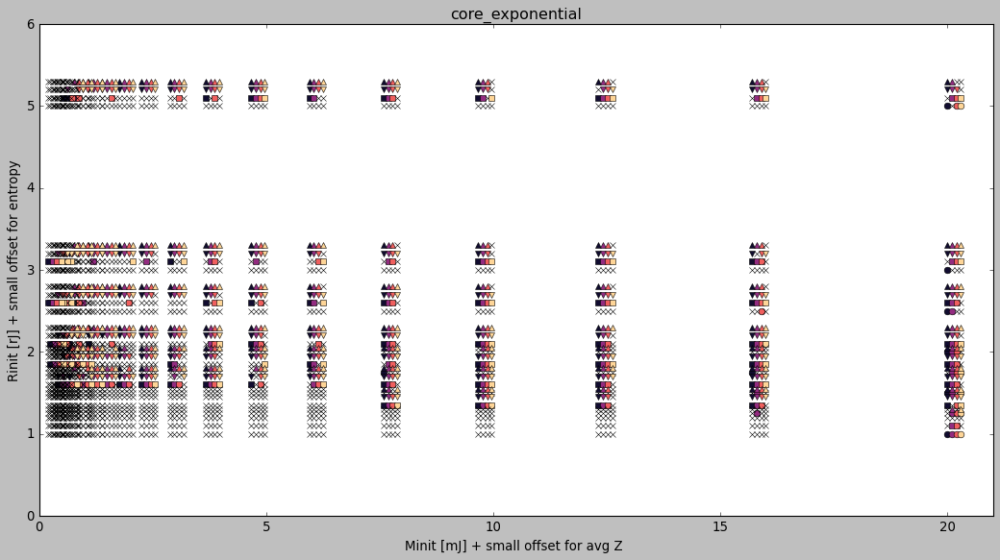

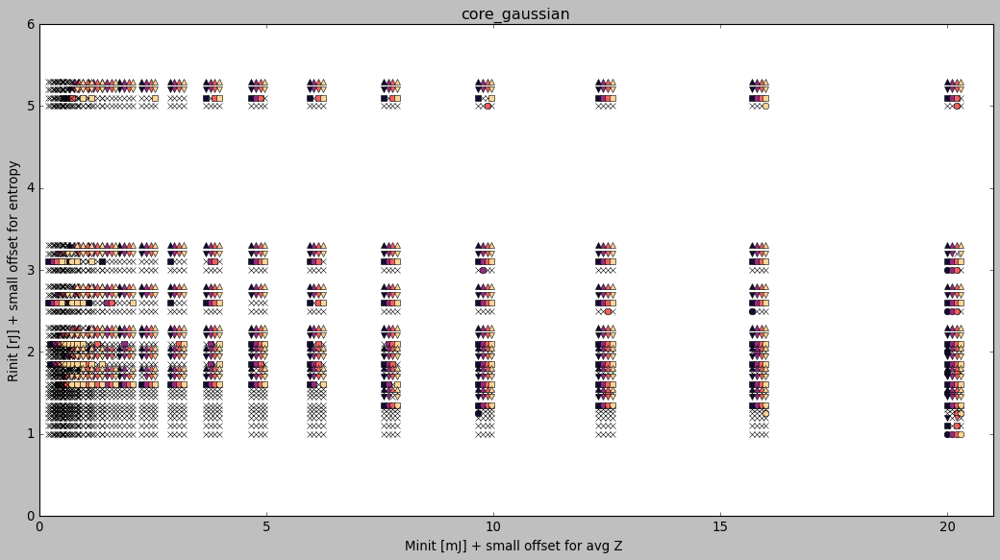

In [25]:

os.chdir('/Users/emily/Documents/astro/giant_planets/science_runs/2_relaxed_models')

create_models_dir = '/Users/emily/Documents/astro/giant_planets/science_runs/1_created_models'
relax_models_dir = '/Users/emily/Documents/astro/giant_planets/science_runs/2_relaxed_models'

markers = ['o','s','v','^']

cm = plt.get_cmap('magma') 
cNorm  = colors.Normalize(vmin=np.log(np.min(Zinit))-0.25, vmax=np.log(np.max(Zinit))+0.25)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cm)


for l, comp in enumerate(comps):
    fig, ax = plt.subplots(1,1,figsize=(16,8))
    for i, m in enumerate(Minit):
        for j, r in enumerate(Rinit):
            for k, z in enumerate(Zinit):
                colorVal = scalarMap.to_rgba(np.log(z))
                for n, s in enumerate(Sinit):
                    #print("Minit is {0}, Rinit is {1}, Zinit is {2}, comp is {3}, Sinit is {4}".format(m,r,z,comp,s))
                    this_comp_dir = "{0}_relaxed".format(comp)
                    
                    relax_model_filename = "{0}/{1}/planet_relax_{2}_Mj_{3}_Rj_zbar={4}_{5}_s={6}.mod".format(relax_models_dir, this_comp_dir, m, r, z, comp, s)

                    if os.path.isfile(relax_model_filename):
                        ax.plot(m+(0.1*k), r+(0.1*n), marker=markers[n],color=colorVal)
                    else:
                        ax.plot(m+(0.1*k), r+(0.1*n), marker='x', color='k')
    ax.set_title("{0}".format(comp))
    ax.set_xlim(0,21)
    ax.set_ylim(0,6)
    ax.set_xlabel("Minit [mJ] + small offset for avg Z ")
    ax.set_ylabel("Rinit [rJ] + small offset for entropy")
    
    plt.show()
                    

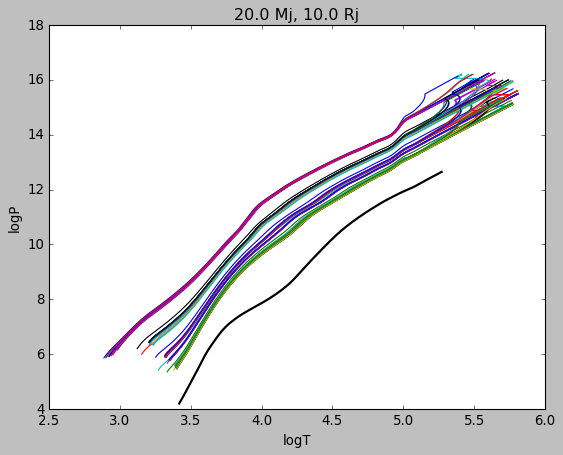

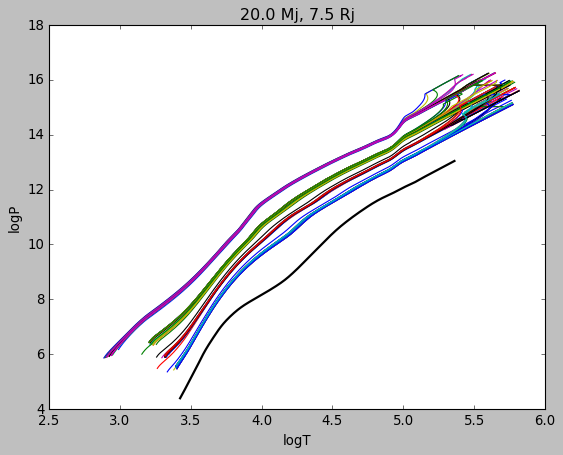

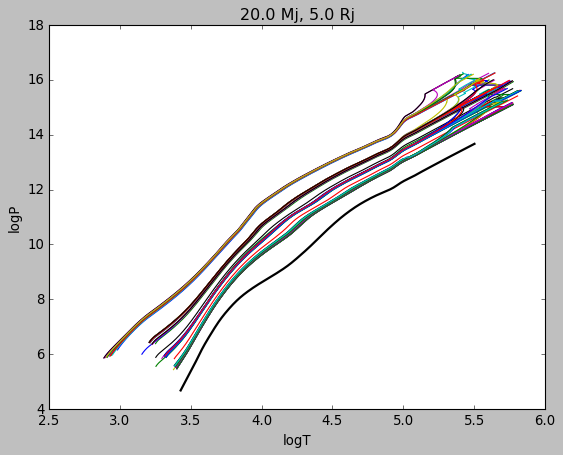

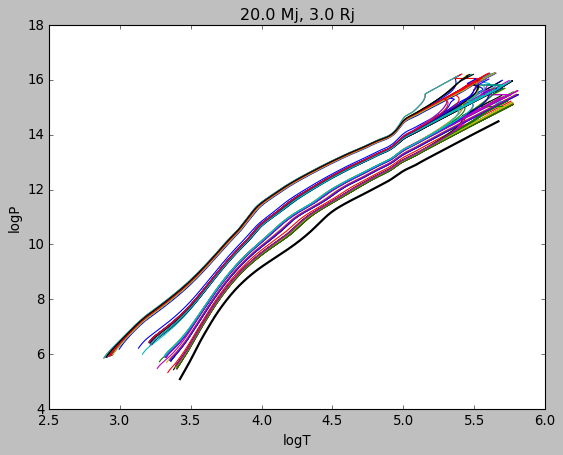

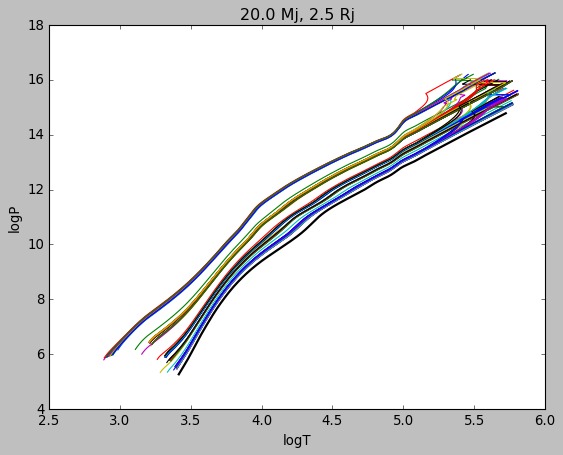

...

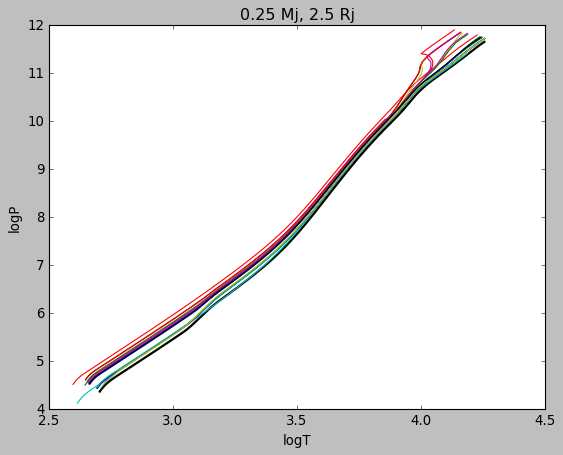

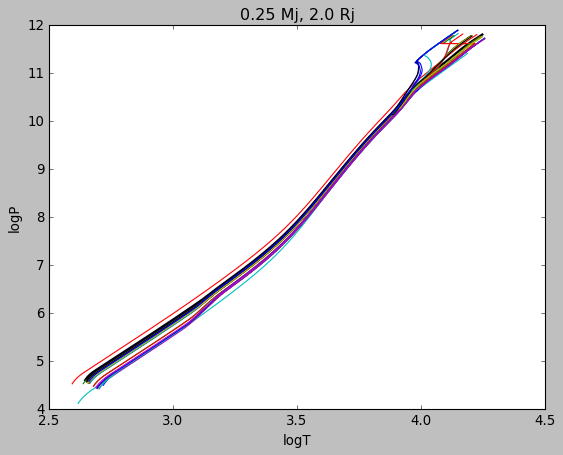

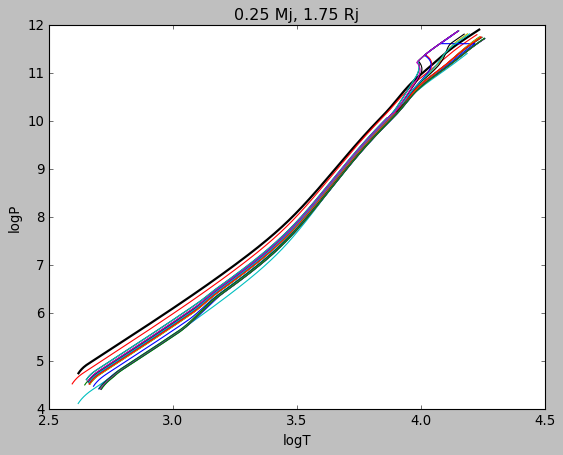

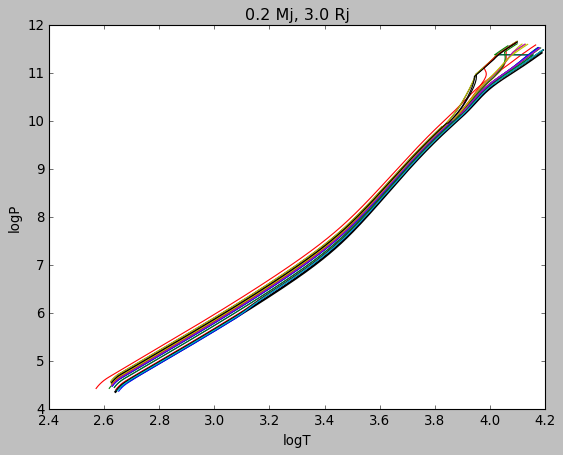

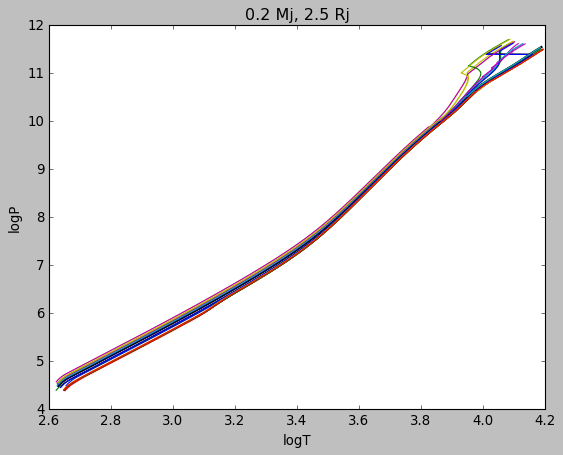

In [26]:
os.chdir('/Users/emily/Documents/astro/giant_planets/science_runs/2_relaxed_models')

create_models_dir = '/Users/emily/Documents/astro/giant_planets/science_runs/1_created_models'
relax_models_dir = '/Users/emily/Documents/astro/giant_planets/science_runs/2_relaxed_models'

markers = ['o','s','v','^']

cm = plt.get_cmap('magma') 
cNorm  = colors.Normalize(vmin=np.log(np.min(Zinit))-0.25, vmax=np.log(np.max(Zinit))+0.25)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cm)



for i, m in enumerate(Minit):
    for j, r in enumerate(Rinit):
        create_profile_filename = "../1_created_models/planet_create_{0}_Mj_{1}_Rj.profile".format(m, r)
        if os.path.isfile(create_profile_filename):
            create_profile = Table.read(create_profile_filename, format="ascii", header_start=4, data_start=5)
            fig, ax = plt.subplots(1,1,figsize=(8,6))
            ax.plot(create_profile['logT'],create_profile['logP'],color='k',lw=2)
            for l, comp in enumerate(comps):
                for k, z in enumerate(Zinit):
                    colorVal = scalarMap.to_rgba(np.log(z))
                    for n, s in enumerate(Sinit):
                        #print("Minit is {0}, Rinit is {1}, Zinit is {2}, comp is {3}, Sinit is {4}".format(m,r,z,comp,s))
                        this_comp_dir = "{0}_relaxed".format(comp)
                        
                        relax_profile_filename = "{0}/{1}/planet_relax_{2}_Mj_{3}_Rj_zbar={4}_{5}_s={6}.profile".format(relax_models_dir, this_comp_dir, m, r, z, comp, s)
    
                        if os.path.isfile(relax_profile_filename):
                            relax_profile = Table.read(relax_profile_filename, format="ascii", header_start=4, data_start=5)
                            ax.plot(relax_profile['logT'],relax_profile['logP'])
                        else:
                            continue
            ax.set_xlabel('logT')
            ax.set_ylabel('logP')
            ax.set_title("{0} Mj, {1} Rj".format(m, r))
            plt.show()
        